In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# Import of necessary libraries

import os
os.environ['USE_PYGEOS'] = '0'
import pandas as pd
import numpy as np
import pickle
import sklearn
from sklearn.metrics import mean_squared_error
import xgboost as xg
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import gc
import ssl
import tqdm

from osgeo import gdal
import geopandas as gpd
import shapely
from scipy.ndimage import rotate

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils
from sklearn.preprocessing import Normalizer

# FastAI
from fastai.vision.all import *
from fastai.text.all import *
from fastai.collab import *
from fastai.tabular.all import *

import utils.data_utils as du
import utils.sp_utils as sp

/home/liqin/miniconda3/envs/test/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
from utils.models import senet
from utils.models import modules
from utils.models import net

In [4]:
# Constants
CHECKPT_PATH = "pretrained_model/im2elevation/Block0_skip_model_110.pth.tar"
UMP = [
        # "AverageHeightArea", 
        # "AverageHeightBuilding", 
        "AverageHeightTotalArea", 
        "Displacement", 
        "FrontalAreaIndex",
        # "MaximumHeight",
        # "PercentileHeight",
        "PlanarAreaIndex",
        "RoughnessLength",
        "StandardDeviation"]

In [5]:
with open("data/ds_tokyo_6.pkl", "rb") as f:
    ds_tokyo = pickle.load(f)

with open("data/ds_osaka_6.pkl", "rb") as f:
    ds_osaka = pickle.load(f)
    
with open("data/ds_ny_6.pkl", "rb") as f:
    ds_ny = pickle.load(f)

In [6]:
with open("data/ds_tokyo_5.pkl", "rb") as f:
    ds_tokyo_old = pickle.load(f)

with open("data/ds_osaka_5.pkl", "rb") as f:
    ds_osaka_old = pickle.load(f)
    
with open("data/ds_ny_5.pkl", "rb") as f:
    ds_ny_old = pickle.load(f)

In [6]:
ds_tokyo.set_UMPs(UMP)
ds_osaka.set_UMPs(UMP)
ds_ny.set_UMPs(UMP)

In [24]:
ds_tokyo[0][1].shape

(6,)

Logging

- UMP distribution is the same

# Data Analysis

In [16]:
# ds_tokyo.images.shape
ds_osaka.UMP_max

[33.766816346936295, 0.8796630610362398, 0.5417395254206459, 50.0144854545483]

<Axes: ylabel='Density'>

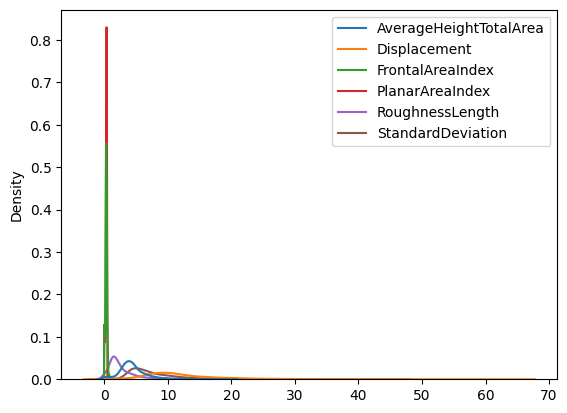

In [128]:
sns.kdeplot(ds_tokyo.ump_df[UMP])

<Axes: ylabel='Density'>

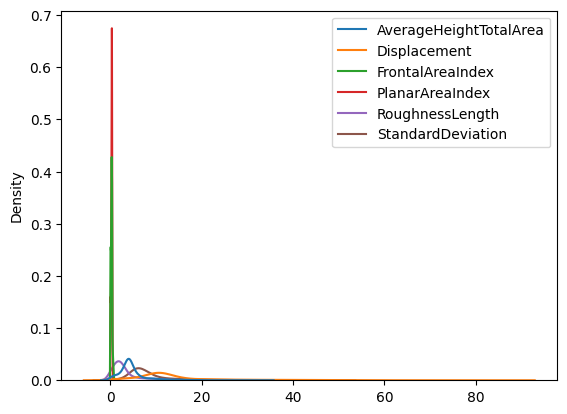

In [26]:
sns.kdeplot(ds_osaka_old.ump_df[UMP])

<Axes: ylabel='Density'>

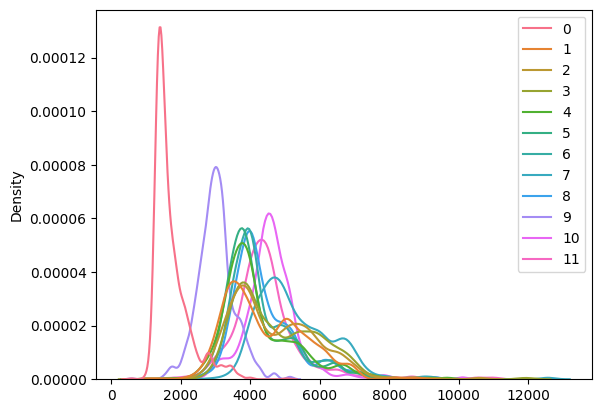

In [12]:
sns.kdeplot(ds_osaka.images.max((2, 3)))

<Axes: ylabel='Density'>

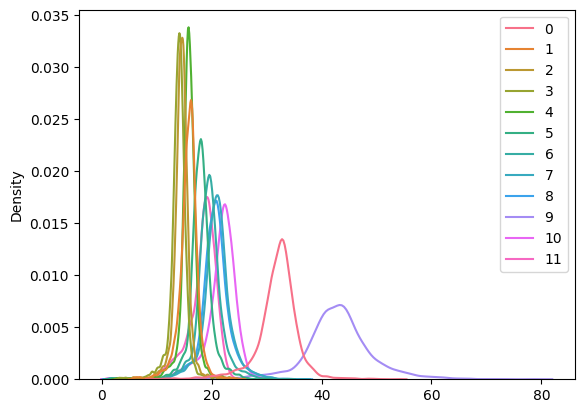

In [136]:
sns.kdeplot(np.mean(ds_tokyo.images, axis= ((2, 3))) / ds_tokyo.channel_max * 255)

<Axes: ylabel='Density'>

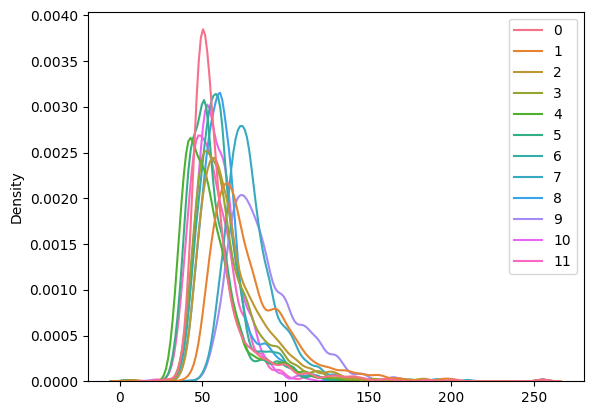

In [137]:
sns.kdeplot(np.max(ds_tokyo.images, axis= ((2, 3))) / ds_tokyo.channel_max * 255)

In [20]:
ds_tokyo.ump_df[UMP].to_numpy().shape

(13144, 6)

# Prediction

## CNN

### Model Shape

In [138]:
original_model = senet.senet154()
Encoder = modules.E_normalised(original_model) # For new ds
# Change sigmoid if UMP changes
model = net.model_n12_light_normalised(Encoder, num_features=2048, block_channel = [256, 512, 1024, 2048], n_out= len(UMP), sigmoid_idx= [3])

In [141]:
from torchinfo import summary
# summary(model, (12, 90, 90), batch_dim = 0, col_names = ("input_size", "output_size", "num_params", "kernel_size", "mult_adds"), verbose = 0)
summary(model, (12, 90, 90), batch_dim = 0, col_names = ("input_size", "output_size"), verbose = 0)

Layer (type:depth-idx)                                  Input Shape               Output Shape
model_n12_light_normalised                              [1, 12, 90, 90]           [1, 6]
├─Conv2d: 1-1                                           [1, 12, 90, 90]           [1, 3, 90, 90]
├─E_normalised: 1-2                                     [1, 3, 90, 90]            [1, 64, 45, 45]
│    └─Sequential: 2-1                                  --                        --
│    │    └─Sequential: 3-1                             --                        --
│    │    └─Sequential: 3-2                             [1, 128, 22, 22]          [1, 256, 22, 22]
│    │    └─Sequential: 3-3                             [1, 256, 22, 22]          [1, 512, 11, 11]
│    │    └─Sequential: 3-4                             [1, 512, 11, 11]          [1, 1024, 6, 6]
│    │    └─Sequential: 3-5                             [1, 1024, 6, 6]           [1, 2048, 3, 3]
├─D2: 1-3                                               [

In [7]:
# CHECKPT_PATH = "overnight_results/model_default_20230727_184820_6" # 6UMP
CHECKPT_PATH = "overnight_results/model_default_20230728_013358_5" # 4 UMP
checkpoint = torch.load(CHECKPT_PATH) # The original IM2ELEVATION weights

ssl._create_default_https_context = ssl._create_unverified_context
original_model = senet.senet154()
Encoder = modules.E_normalised(original_model) # For new ds
# Change sigmoid if UMP changes
model = net.model_n12_light_normalised(Encoder, num_features=2048, block_channel = [256, 512, 1024, 2048], n_out= len(UMP), sigmoid_idx= [3])
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = nn.DataParallel(model)
model.to(device)

model.load_state_dict(checkpoint, strict=True)
del checkpoint
gc.collect()
torch.cuda.empty_cache()

In [8]:
# Set up dataloaders
dl_tokyo = DataLoader(ds_tokyo, 64, device= "cuda")
dl_osaka = DataLoader(ds_osaka, 64, device= "cuda")
dl_ny = DataLoader(ds_ny, 64, device= "cuda")

In [10]:
model.train(False)
with torch.no_grad():
    tokyo_y = []
    tokyo_preds = []
    for data in tqdm.tqdm(dl_tokyo):
        x, y = data
        outputs = model(x.float())
        tokyo_y.append(y.float())
        tokyo_preds.append(outputs)
tokyo_y = torch.cat(tokyo_y)
tokyo_preds = torch.cat(tokyo_preds)
print(F.mse_loss(tokyo_y, tokyo_preds))

100%|██████████| 206/206 [01:30<00:00,  2.29it/s]

tensor(0.0001, device='cuda:0')


In [9]:
model.train(False)
model.eval()
with torch.no_grad():
    osaka_y = []
    osaka_preds = []
    for data in tqdm.tqdm(dl_osaka):
        x, y = data
        outputs = model(x.float())
        osaka_y.append(y.float())
        osaka_preds.append(outputs)
osaka_y = torch.cat(osaka_y)
osaka_preds = torch.cat(osaka_preds)
print(F.mse_loss(osaka_y, osaka_preds))


  0%|          | 0/72 [00:00<?, ?it/s]

100%|██████████| 72/72 [00:37<00:00,  1.92it/s]

tensor(0.0447, device='cuda:0')


In [33]:
model.train(False)
with torch.no_grad():
    ny_y = []
    ny_preds = []
    for data in tqdm.tqdm(dl_ny):
        x, y = data
        outputs = model(x.float())
        ny_y.append(y.float())
        ny_preds.append(outputs)
ny_y = torch.cat(ny_y)
ny_preds = torch.cat(ny_preds)
print(F.mse_loss(ny_y, ny_preds))


  0%|          | 0/341 [00:00<?, ?it/s]

100%|██████████| 341/341 [02:24<00:00,  2.37it/s]

tensor(0.0123, device='cuda:0')


### Graphs

<Axes: ylabel='Density'>

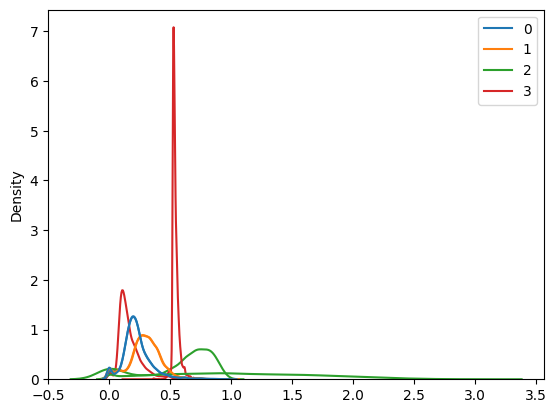

In [22]:
# See the distribution
# fig = plt.subplots(1, 2, figsize= (20, 10))
sns.kdeplot(tokyo_y.cpu())
sns.kdeplot(tokyo_preds.cpu())

<Axes: ylabel='Density'>

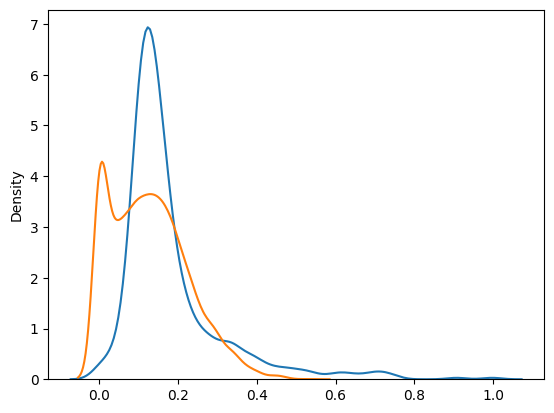

In [68]:
# 0, 1, 3, 5
i = 5
sns.kdeplot(osaka_y.cpu()[:, i])
sns.kdeplot(osaka_preds.cpu()[:, i])

<Axes: ylabel='Density'>

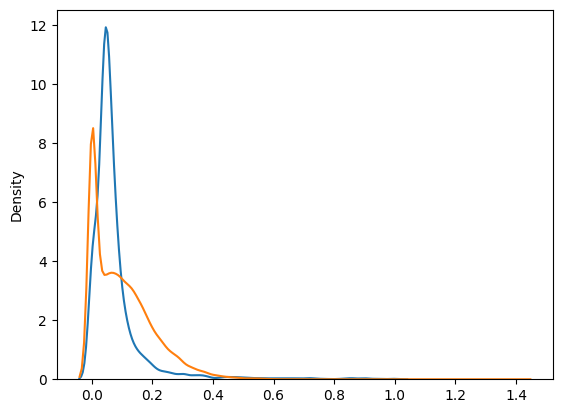

In [63]:
# 0, 1, 3, 5
i = 5
sns.kdeplot(ny_y.cpu()[:, i])
sns.kdeplot(ny_preds.cpu()[:, i])

In [153]:
# Plotting Train and validation loss
train_graph = pd.read_csv("results/run-sentinel_default_20230728_171305_Training vs. Validation Loss_Training-tag-Training vs. Validation Loss.csv")
val_graph = pd.read_csv("results/run-sentinel_default_20230728_171305_Training vs. Validation Loss_Validation-tag-Training vs. Validation Loss.csv")
train_detail_graph = pd.read_csv("results/run-sentinel_default_20230728_171305-tag-Loss_train.csv")

In [167]:
pd.concat([train_graph, val_graph], axis= 1)

,Wall time,Step,Value,Wall time,Step,Value
0,1.690536e+09,1,0.318125,1.690536e+09,1,0.049237
1,1.690536e+09,2,0.102516,1.690536e+09,2,0.025316
2,1.690536e+09,3,0.083490,1.690536e+09,3,0.033516
3,1.690537e+09,4,0.078297,1.690537e+09,4,0.022955
4,1.690537e+09,5,0.072822,1.690537e+09,5,0.026652
5,1.690537e+09,6,0.066434,1.690537e+09,6,0.024694
6,1.690538e+09,7,0.059364,1.690538e+09,7,0.027014
7,1.690538e+09,8,0.053812,1.690538e+09,8,0.028806
8,1.690538e+09,9,0.050491,1.690538e+09,9,0.027704
9,1.690539e+09,10,0.045026,1.690539e+09,10,0.028969


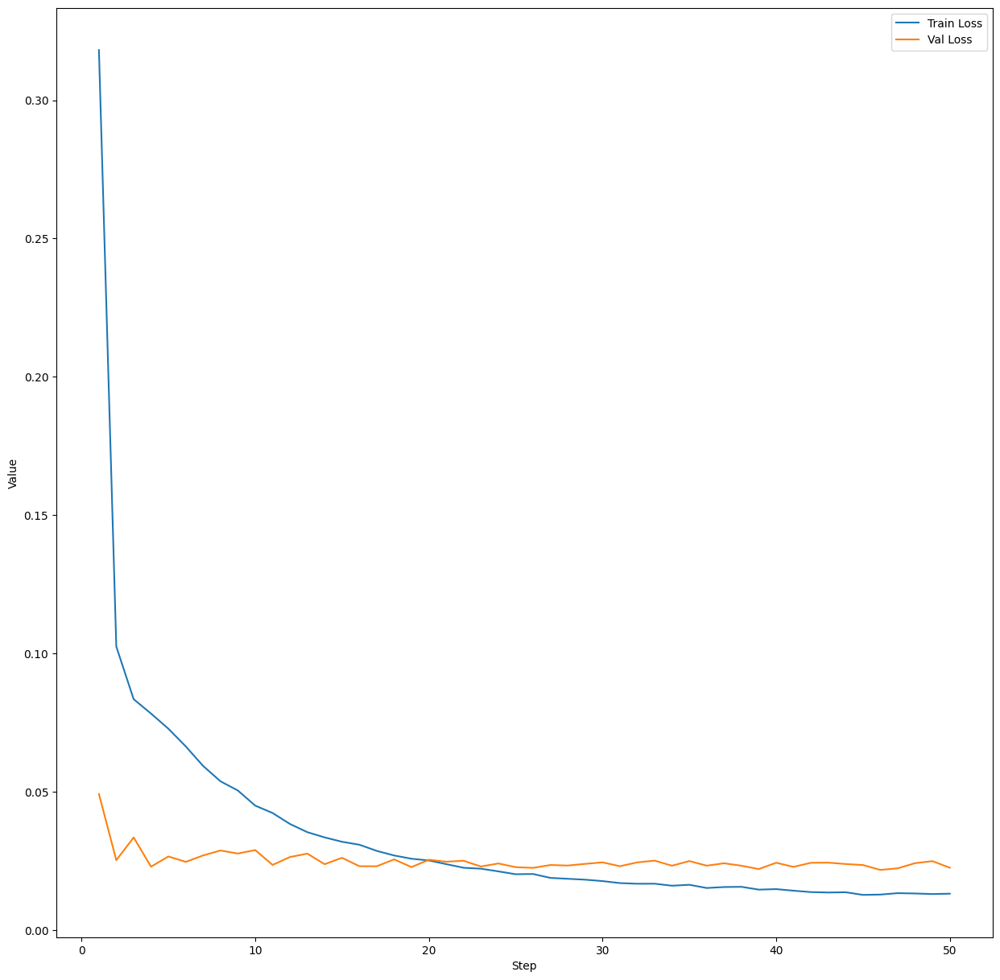

In [185]:
# sns.reset_defaults()
fig = plt.figure(figsize= (15, 15))
sns.lineplot(data= train_graph, x= "Step", y= "Value", label= "Train Loss")
sns.lineplot(data= val_graph, x= "Step", y= "Value", label= "Val Loss")
# Legend
custom = [Line2D([], [], marker='.', color='blue', linestyle='None'), Line2D([], [], marker='.', color='red', linestyle='None')]
# fig.legend(custom, ['Train', 'Val'], loc='upper right')
plt.legend()
# plt.legend(['Train', 'Val'], loc='upper right')
plt.show()

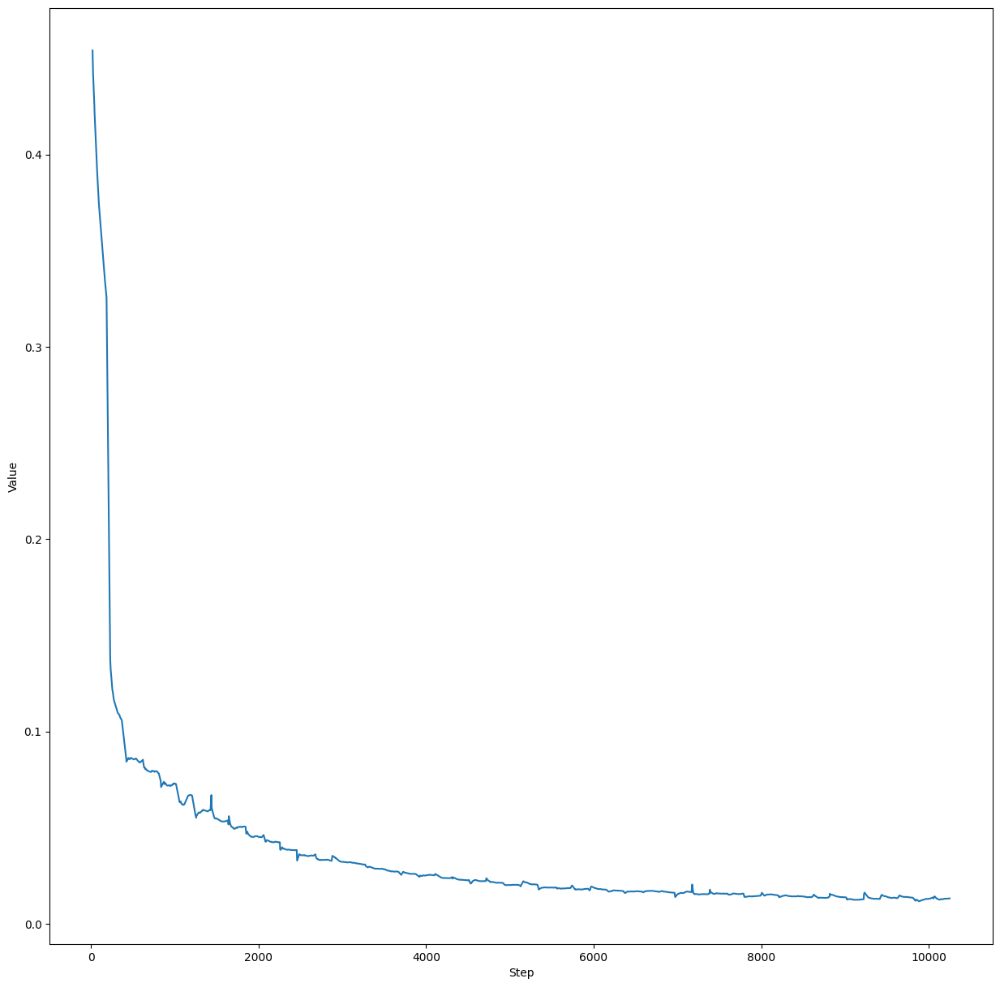

In [184]:
fig = plt.figure(figsize= (15, 15))
sns.lineplot(data= train_detail_graph, x= "Step", y= "Value")
plt.show()

## LR

In [144]:
# Load CNN pred data
with torch.no_grad():
    with open("tokyo_preds_46.pkl", "rb") as f:
        tokyo_preds = pickle.load(f).cpu()
    with open("tokyo_y_46.pkl", "rb") as f:
        tokyo_y = pickle.load(f).cpu()
    with open("osaka_preds_46.pkl", "rb") as f:
        osaka_preds = pickle.load(f).cpu()
    with open("osaka_y_46.pkl", "rb") as f:
        osaka_y = pickle.load(f).cpu()
    with open("ny_preds_46.pkl", "rb") as f:
        ny_preds = pickle.load(f).cpu()
    with open("ny_y_46.pkl", "rb") as f:
        ny_y = pickle.load(f).cpu()

In [142]:
# Load CNN pred data
with torch.no_grad():
    with open("results/tokyo_preds_20230729_145853_48.pkl", "rb") as f:
        tokyo_preds = pickle.load(f).cpu()
    with open("results/tokyo_y_20230729_145853_48.pkl", "rb") as f:
        tokyo_y = pickle.load(f).cpu()
    with open("results/osaka_preds_20230729_145853_48.pkl", "rb") as f:
        osaka_preds = pickle.load(f).cpu()
    with open("results/osaka_y_20230729_145853_48.pkl", "rb") as f:
        osaka_y = pickle.load(f).cpu()
    with open("results/ny_preds_20230729_145853_48.pkl", "rb") as f:
        ny_preds = pickle.load(f).cpu()
    with open("results/ny_y_20230729_145853_48.pkl", "rb") as f:
        ny_y = pickle.load(f).cpu()
    
    with open("results/tokyo_bounds_20230729_145853_48.pkl", "rb") as f:
        tokyo_bounds = pickle.load(f).cpu()
    with open("results/osaka_bounds_20230729_145853_48.pkl", "rb") as f:
        osaka_bounds = pickle.load(f).cpu()
    with open("results/ny_bounds_20230729_145853_48.pkl", "rb") as f:
        ny_bounds = pickle.load(f).cpu()

In [145]:
# Calculate Loss
cnn_tokyo_loss = torch.sqrt(F.mse_loss(tokyo_y, tokyo_preds))
cnn_osaka_loss = torch.sqrt(F.mse_loss(osaka_y, osaka_preds))
cnn_ny_loss = torch.sqrt(F.mse_loss(ny_y, ny_preds))
print(cnn_tokyo_loss)
print(cnn_osaka_loss)
print(cnn_ny_loss)

tensor(0.0130, dtype=torch.float64)
tensor(0.1174, dtype=torch.float64)
tensor(0.1025, dtype=torch.float64)


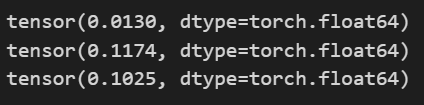

In [146]:
# Fit the regressors
from sklearn.linear_model import LinearRegression
# Scores using mean/non-normalised values
x_mean_train = ds_tokyo.images.mean((2, 3))
x_mean_val = ds_osaka.images.mean((2, 3))
x_mean_test = ds_ny.images.mean((2, 3))
y_train = (ds_tokyo.ump_df[UMP] / ds_tokyo.UMP_max).to_numpy()
y_val = (ds_osaka.ump_df[UMP] / ds_tokyo.UMP_max).to_numpy()
y_test = (ds_ny.ump_df[UMP] / ds_tokyo.UMP_max).to_numpy()
regs_mean = []
# Redo with different order than CNN since order doesn't matter, ensure data integrity first
for i in range(len(UMP)):
    reg = LinearRegression()
    reg.fit(x_mean_train, y_train[:, i]) 
    regs_mean.append(reg)

In [147]:
lr_train_loss = torch.sqrt(F.mse_loss(torch.column_stack([torch.tensor(regs_mean[i].predict(x_mean_train)) for i in range(len(UMP))]), torch.tensor(y_train)))
lr_val_loss = torch.sqrt(F.mse_loss(torch.column_stack([torch.tensor(regs_mean[i].predict(x_mean_val)) for i in range(len(UMP))]), torch.tensor(y_val)))
lr_test_loss = torch.sqrt(F.mse_loss(torch.column_stack([torch.tensor(regs_mean[i].predict(x_mean_test)) for i in range(len(UMP))]), torch.tensor(y_test)))
print(f"LR Loss Train: {lr_train_loss}, Val: {lr_val_loss}, Test: {lr_test_loss}")


LR Loss Train: 0.09307552659770435, Val: 0.13262443699705406, Test: 0.2243165110827516


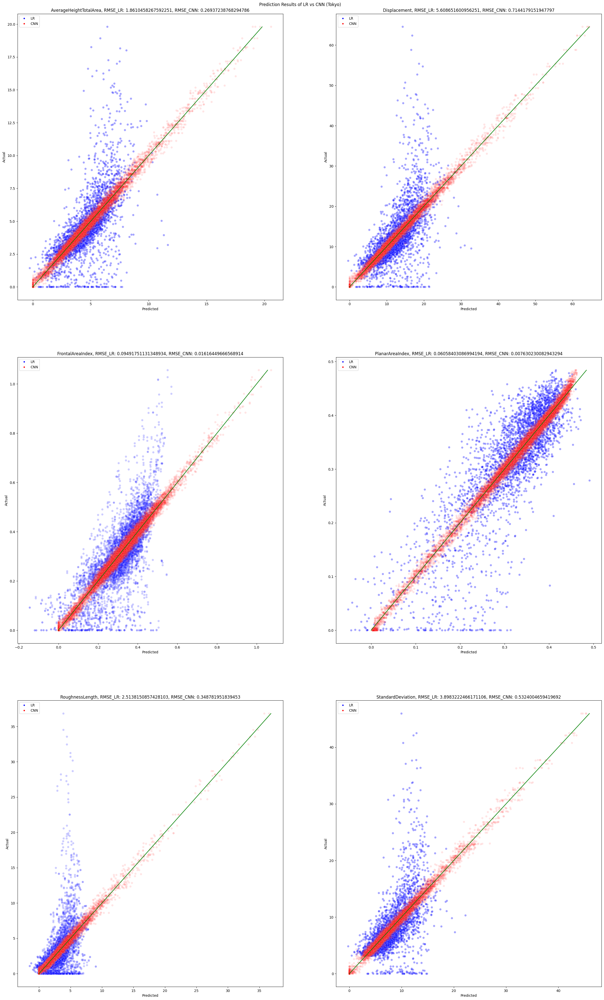

In [43]:
# Tokyo comparison
fig, axes = plt.subplots(3, 2, figsize= (30, 45))
fig.suptitle('Prediction Results of LR vs CNN (Tokyo)')
fig.subplots_adjust(top=0.97)
for ump in range(tokyo_y.shape[1]):
    # Center Line
    ax = sns.lineplot(x= y_train[:, ump]*ds_tokyo.UMP_max[ump], y = y_train[:, ump]*ds_tokyo.UMP_max[ump], ax= axes[ump//2, ump%2], color= "green")

    # LR
    sns.scatterplot(x= regs_mean[ump].predict(x_mean_train)*ds_tokyo.UMP_max[ump], y= y_train[:, ump]*ds_tokyo.UMP_max[ump], alpha= 0.1, ax= axes[ump//2, ump%2], color= "blue")

    # CNN
    sns.scatterplot(y= tokyo_y[:, ump].cpu()* ds_tokyo.UMP_max[ump], x= tokyo_preds[:, ump].cpu()* ds_tokyo.UMP_max[ump], alpha= 0.1, ax= axes[ump//2, ump%2], color= "red")
    
    # Labels
    ax.set(ylabel= "Actual", xlabel= "Predicted")
    rmse_lr = math.sqrt(sklearn.metrics.mean_squared_error(regs_mean[ump].predict(x_mean_train), y_train[:, ump]))* ds_tokyo.UMP_max[ump]
    rmse_cnn = math.sqrt(sklearn.metrics.mean_squared_error(tokyo_preds[:, ump].cpu(), tokyo_y[:, ump].cpu()))* ds_tokyo.UMP_max[ump]

    axes[ump//2, ump%2].set_title(f"{UMP[ump]}, RMSE_LR: {rmse_lr}, RMSE_CNN: {rmse_cnn}")

    # Legend
    custom = [Line2D([], [], marker='.', color='blue', linestyle='None'), Line2D([], [], marker='.', color='red', linestyle='None')]
    ax.legend(custom, ['LR', 'CNN'], loc='upper left')

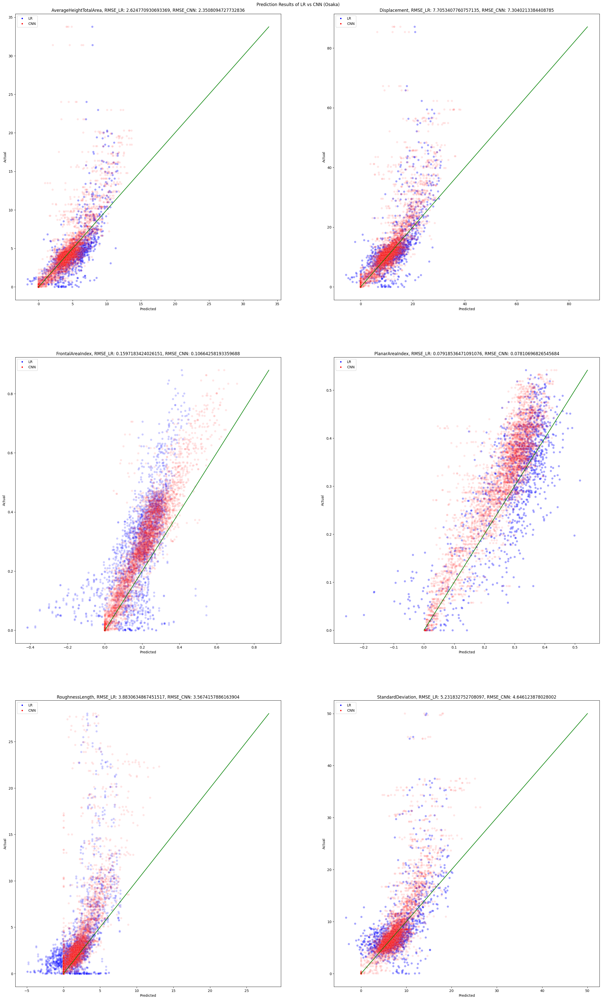

In [44]:
# Osaka comparison
fig, axes = plt.subplots(3, 2, figsize= (30, 45))
fig.suptitle('Prediction Results of LR vs CNN (Osaka)')
fig.subplots_adjust(top=0.97)
for ump in range(osaka_y.shape[1]):
    # Center Line
    ax = sns.lineplot(x= y_val[:, ump]*ds_tokyo.UMP_max[ump], y = y_val[:, ump]*ds_tokyo.UMP_max[ump], ax= axes[ump//2, ump%2], color= "green")

    # LR
    sns.scatterplot(x= regs_mean[ump].predict(x_mean_val)*ds_tokyo.UMP_max[ump], y= y_val[:, ump]*ds_tokyo.UMP_max[ump], alpha= 0.1, ax= axes[ump//2, ump%2], color= "blue")

    # CNN
    sns.scatterplot(y= osaka_y[:, ump].cpu()* ds_tokyo.UMP_max[ump], x= osaka_preds[:, ump].cpu()* ds_tokyo.UMP_max[ump], alpha= 0.1, ax= axes[ump//2, ump%2], color= "red")
    
    # Labels
    ax.set(ylabel= "Actual", xlabel= "Predicted")
    rmse_lr = math.sqrt(sklearn.metrics.mean_squared_error(regs_mean[ump].predict(x_mean_val), y_val[:, ump]))* ds_tokyo.UMP_max[ump]
    rmse_cnn = math.sqrt(sklearn.metrics.mean_squared_error(osaka_preds[:, ump].cpu(), osaka_y[:, ump].cpu()))* ds_tokyo.UMP_max[ump]

    axes[ump//2, ump%2].set_title(f"{UMP[ump]}, RMSE_LR: {rmse_lr}, RMSE_CNN: {rmse_cnn}")

    # Legend
    custom = [Line2D([], [], marker='.', color='blue', linestyle='None'), Line2D([], [], marker='.', color='red', linestyle='None')]
    ax.legend(custom, ['LR', 'CNN'], loc='upper left')

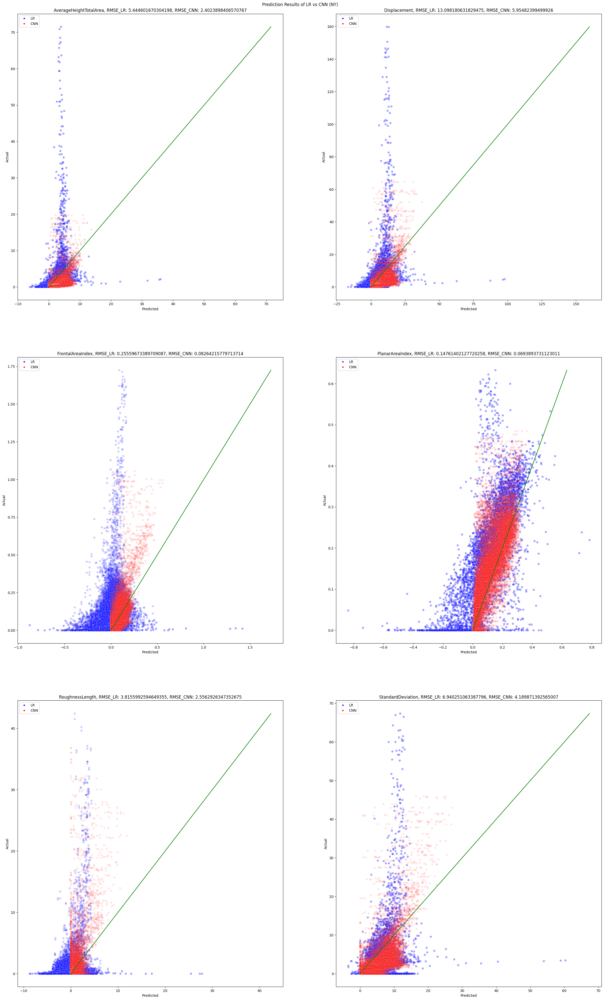

In [45]:
# NY comparison
fig, axes = plt.subplots(3, 2, figsize= (30, 45))
fig.suptitle('Prediction Results of LR vs CNN (NY)')
fig.subplots_adjust(top=0.97)
for ump in range(ny_y.shape[1]):
    # Center Line
    ax = sns.lineplot(x= y_test[:, ump]*ds_tokyo.UMP_max[ump], y = y_test[:, ump]*ds_tokyo.UMP_max[ump], ax= axes[ump//2, ump%2], color= "green")

    # LR
    sns.scatterplot(x= regs_mean[ump].predict(x_mean_test)*ds_tokyo.UMP_max[ump], y= y_test[:, ump]*ds_tokyo.UMP_max[ump], alpha= 0.1, ax= axes[ump//2, ump%2], color= "blue")

    # CNN
    sns.scatterplot(y= ny_y[:, ump].cpu()* ds_tokyo.UMP_max[ump], x= ny_preds[:, ump].cpu()* ds_tokyo.UMP_max[ump], alpha= 0.1, ax= axes[ump//2, ump%2], color= "red")
    
    # Labels
    ax.set(ylabel= "Actual", xlabel= "Predicted")
    rmse_lr = math.sqrt(sklearn.metrics.mean_squared_error(regs_mean[ump].predict(x_mean_test), y_test[:, ump]))* ds_tokyo.UMP_max[ump]
    rmse_cnn = math.sqrt(sklearn.metrics.mean_squared_error(ny_preds[:, ump].cpu(), ny_y[:, ump].cpu()))* ds_tokyo.UMP_max[ump]

    axes[ump//2, ump%2].set_title(f"{UMP[ump]}, RMSE_LR: {rmse_lr}, RMSE_CNN: {rmse_cnn}")

    # Legend
    custom = [Line2D([], [], marker='.', color='blue', linestyle='None'), Line2D([], [], marker='.', color='red', linestyle='None')]
    ax.legend(custom, ['LR', 'CNN'], loc='upper left')

In [ ]:
# Plot the map data

#### XG Boost

In [47]:
import xgboost as xg
from sklearn.metrics import mean_squared_error

# Find the best settings for each parameter

min_train_loss = [1000 for _ in range(len(UMP))]
min_val_loss = [1000 for _ in range(len(UMP))]
params_train_lst = [(1, 1) for _ in range(len(UMP))]
params_val_lst = [(1, 1) for _ in range(len(UMP))]


xgb_lst = [None for _ in range(len(UMP))]
for n_estimators in tqdm.tqdm(range(1, 20)):
    for max_depth in range(1, 10):
        for ump in range(len(UMP)):
            xgb_r = xg.XGBRegressor(n_estimators= n_estimators, max_depth= max_depth)
            xgb_r.fit(x_mean_train, y_train[:, ump])
            train_mse = math.sqrt(mean_squared_error(xgb_r.predict(x_mean_train), y_train[:, ump]))
            val_mse = math.sqrt(mean_squared_error(xgb_r.predict(x_mean_val), y_val[:, ump]))
            if train_mse < min_train_loss[ump]:
                min_train_loss[ump] = train_mse
                params_train_lst[ump] = (n_estimators, max_depth)
            if val_mse < min_val_loss[ump]:
                min_val_loss[ump] = val_mse
                params_val_lst[ump] = (n_estimators, max_depth)
                xgb_lst[ump] = xgb_r

for i in range(len(UMP)):
    print(f"""{UMP[i]}:
    MSE_Train: {min_train_loss[i]}
    MSE_Val: {min_val_loss[i]}
    Params_train: {params_train_lst[i]}
    Params_val: {params_val_lst[i]}
    """)

  0%|          | 0/19 [00:00<?, ?it/s]

100%|██████████| 19/19 [1:24:01<00:00, 265.35s/it]

AverageHeightTotalArea:
    MSE_Train: 0.02334226704558981
    MSE_Val: 0.15388649159919515
    Params_train: (19, 9)
    Params_val: (13, 4)
    
Displacement:
    MSE_Train: 0.025734511806284686
    MSE_Val: 0.14021083803624718
    Params_train: (19, 9)
    Params_val: (19, 3)
    
FrontalAreaIndex:
    MSE_Train: 0.025695546674338734
    MSE_Val: 0.13357295952888176
    Params_train: (19, 9)
    Params_val: (5, 7)
    
PlanarAreaIndex:
    MSE_Train: 0.03159071625120004
    MSE_Val: 0.224487815969299
    Params_train: (19, 9)
    Params_val: (3, 1)
    
RoughnessLength:
    MSE_Train: 0.020147840399822477
    MSE_Val: 0.11094475248644775
    Params_train: (19, 9)
    Params_val: (8, 3)
    
StandardDeviation:
    MSE_Train: 0.025764563666732132
    MSE_Val: 0.12858130607694548
    Params_train: (19, 9)
    Params_val: (9, 6)
    


AverageHeightTotalArea:
    MSE_Train: 0.02334226704558981
    MSE_Val: 0.15388649159919515
    Params_train: (19, 9)
    Params_val: (13, 4)
    
Displacement:
    MSE_Train: 0.025734511806284686
    MSE_Val: 0.14021083803624718
    Params_train: (19, 9)
    Params_val: (19, 3)
    
FrontalAreaIndex:
    MSE_Train: 0.025695546674338734
    MSE_Val: 0.13357295952888176
    Params_train: (19, 9)
    Params_val: (5, 7)
    
PlanarAreaIndex:
    MSE_Train: 0.03159071625120004
    MSE_Val: 0.224487815969299
    Params_train: (19, 9)
    Params_val: (3, 1)
    
RoughnessLength:
    MSE_Train: 0.020147840399822477
    MSE_Val: 0.11094475248644775
    Params_train: (19, 9)
    Params_val: (8, 3)
    
StandardDeviation:
    MSE_Train: 0.025764563666732132
    MSE_Val: 0.12858130607694548
    Params_train: (19, 9)
    Params_val: (9, 6)

In [148]:
xgb_params = [(13, 4), (19, 3), (5, 7), (3, 1), (8, 3), (9, 3)]
xgb_lst = []
for ump in range(len(UMP)):
    xgb_r = xg.XGBRegressor(n_estimators= xgb_params[ump][0], max_depth= xgb_params[ump][1])
    xgb_r.fit(x_mean_train, y_train[:, ump])
    xgb_lst.append(xgb_r)

xgb_train_loss = torch.sqrt(F.mse_loss(torch.column_stack([torch.tensor(xgb_lst[ump].predict(x_mean_train)) for ump in range(len(UMP))]), torch.tensor(y_train)))
xgb_val_loss = torch.sqrt(F.mse_loss(torch.column_stack([torch.tensor(xgb_lst[ump].predict(x_mean_val)) for ump in range(len(UMP))]), torch.tensor(y_val)))
xgb_test_loss = torch.sqrt(F.mse_loss(torch.column_stack([torch.tensor(xgb_lst[ump].predict(x_mean_test)) for ump in range(len(UMP))]), torch.tensor(y_test)))
print(f"XGBoost Loss Train: {xgb_train_loss}, Val: {xgb_val_loss}, Test: {xgb_test_loss}")

XGBoost Loss Train: 0.10451538683640381, Val: 0.15345580979989568, Test: 0.19780832197577747


In [51]:
torch.column_stack([torch.tensor(xgb_lst[ump].predict(x_mean_train)) for ump in range(len(UMP))]).shape, y_train.shape

(torch.Size([13144, 6]), (13144, 6))

In [149]:
print(f"LR Loss Train: {lr_train_loss}, Val: {lr_val_loss}, NY: {lr_test_loss}")
print(f"CNN Loss Train: {cnn_tokyo_loss}, Val: {cnn_osaka_loss}, NY: {cnn_ny_loss}")
print(f"XGBoost Loss Train: {xgb_train_loss}, Val: {xgb_val_loss}, NY: {xgb_test_loss}")

LR Loss Train: 0.09307552659770435, Val: 0.13262443699705406, NY: 0.2243165110827516
CNN Loss Train: 0.013001710140021081, Val: 0.11742352219501043, NY: 0.10249099520718295
XGBoost Loss Train: 0.10451538683640381, Val: 0.15345580979989568, NY: 0.19780832197577747


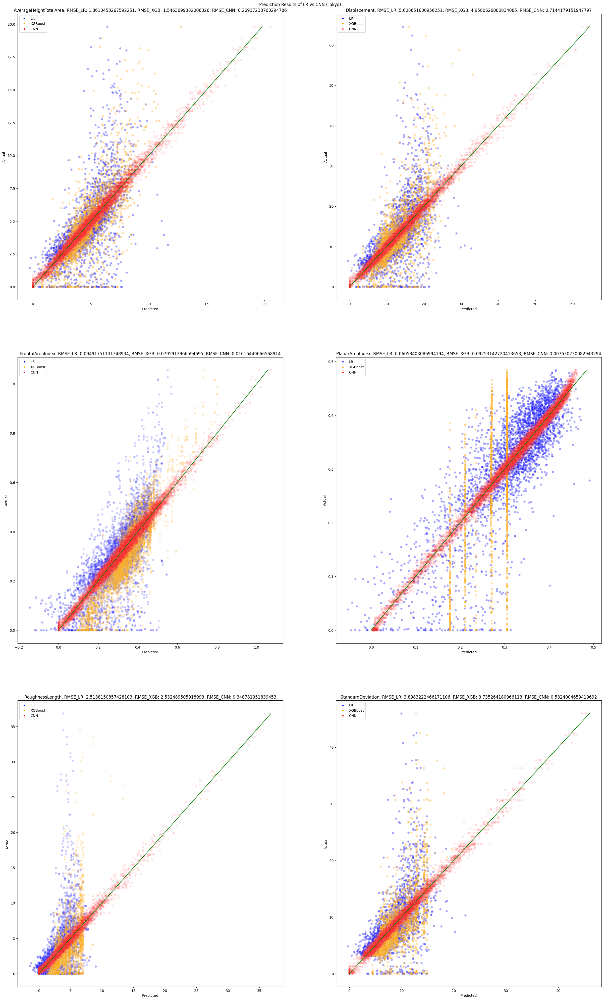

In [150]:
# Tokyo comparison
fig, axes = plt.subplots(3, 2, figsize= (30, 45))
fig.suptitle('Prediction Results of LR vs CNN (Tokyo)')
fig.subplots_adjust(top=0.97)
for ump in range(tokyo_y.shape[1]):
    # Center Line
    ax = sns.lineplot(x= y_train[:, ump]*ds_tokyo.UMP_max[ump], y = y_train[:, ump]*ds_tokyo.UMP_max[ump], ax= axes[ump//2, ump%2], color= "green")

    # LR
    sns.scatterplot(x= regs_mean[ump].predict(x_mean_train)*ds_tokyo.UMP_max[ump], y= y_train[:, ump]*ds_tokyo.UMP_max[ump], alpha= 0.1, ax= axes[ump//2, ump%2], color= "blue")

    # XGBoost
    sns.scatterplot(x= xgb_lst[ump].predict(x_mean_train)*ds_tokyo.UMP_max[ump], y= y_train[:, ump]*ds_tokyo.UMP_max[ump], alpha= 0.1, ax= axes[ump//2, ump%2], color= "orange")

    # CNN
    sns.scatterplot(y= tokyo_y[:, ump].cpu()* ds_tokyo.UMP_max[ump], x= tokyo_preds[:, ump].cpu()* ds_tokyo.UMP_max[ump], alpha= 0.1, ax= axes[ump//2, ump%2], color= "red")
    
    # Labels
    ax.set(ylabel= "Actual", xlabel= "Predicted")
    rmse_lr = math.sqrt(sklearn.metrics.mean_squared_error(regs_mean[ump].predict(x_mean_train), y_train[:, ump]))* ds_tokyo.UMP_max[ump]
    rmse_xgb = math.sqrt(sklearn.metrics.mean_squared_error(xgb_lst[ump].predict(x_mean_train), y_train[:, ump]))* ds_tokyo.UMP_max[ump]
    rmse_cnn = math.sqrt(sklearn.metrics.mean_squared_error(tokyo_preds[:, ump].cpu(), tokyo_y[:, ump].cpu()))* ds_tokyo.UMP_max[ump]

    axes[ump//2, ump%2].set_title(f"{UMP[ump]}, RMSE_LR: {rmse_lr}, RMSE_XGB: {rmse_xgb}, RMSE_CNN: {rmse_cnn}")

    # Legend
    custom = [Line2D([], [], marker='.', color='blue', linestyle='None'), 
              Line2D([], [], marker='.', color='orange', linestyle='None'),
              Line2D([], [], marker='.', color='red', linestyle='None')]
    ax.legend(custom, ['LR', 'XGBoost', 'CNN'], loc='upper left')

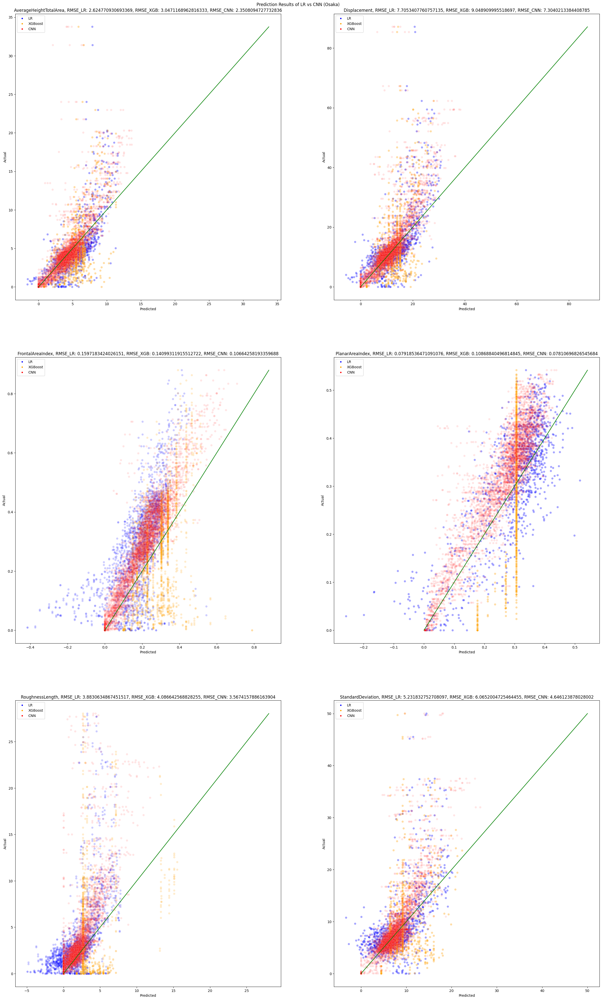

In [151]:
# Osaka comparison
fig, axes = plt.subplots(3, 2, figsize= (30, 45))
fig.suptitle('Prediction Results of LR vs CNN (Osaka)')
fig.subplots_adjust(top=0.97)
for ump in range(osaka_y.shape[1]):
    # Center Line
    ax = sns.lineplot(x= y_val[:, ump]*ds_tokyo.UMP_max[ump], y = y_val[:, ump]*ds_tokyo.UMP_max[ump], ax= axes[ump//2, ump%2], color= "green")

    # LR
    sns.scatterplot(x= regs_mean[ump].predict(x_mean_val)*ds_tokyo.UMP_max[ump], y= y_val[:, ump]*ds_tokyo.UMP_max[ump], alpha= 0.1, ax= axes[ump//2, ump%2], color= "blue")

    # XGBoost
    sns.scatterplot(x= xgb_lst[ump].predict(x_mean_val)*ds_tokyo.UMP_max[ump], y= y_val[:, ump]*ds_tokyo.UMP_max[ump], alpha= 0.1, ax= axes[ump//2, ump%2], color= "orange")

    # CNN
    sns.scatterplot(y= osaka_y[:, ump].cpu()* ds_tokyo.UMP_max[ump], x= osaka_preds[:, ump].cpu()* ds_tokyo.UMP_max[ump], alpha= 0.1, ax= axes[ump//2, ump%2], color= "red")
    
    # Labels
    ax.set(ylabel= "Actual", xlabel= "Predicted")
    rmse_lr = math.sqrt(sklearn.metrics.mean_squared_error(regs_mean[ump].predict(x_mean_val), y_val[:, ump]))* ds_tokyo.UMP_max[ump]
    rmse_xgb = math.sqrt(sklearn.metrics.mean_squared_error(xgb_lst[ump].predict(x_mean_val), y_val[:, ump]))* ds_tokyo.UMP_max[ump]
    rmse_cnn = math.sqrt(sklearn.metrics.mean_squared_error(osaka_preds[:, ump].cpu(), osaka_y[:, ump].cpu()))* ds_tokyo.UMP_max[ump]

    axes[ump//2, ump%2].set_title(f"{UMP[ump]}, RMSE_LR: {rmse_lr}, RMSE_XGB: {rmse_xgb}, RMSE_CNN: {rmse_cnn}")

    # Legend
    custom = [Line2D([], [], marker='.', color='blue', linestyle='None'), 
              Line2D([], [], marker='.', color='orange', linestyle='None'),
              Line2D([], [], marker='.', color='red', linestyle='None')]
    ax.legend(custom, ['LR', 'XGBoost', 'CNN'], loc='upper left')

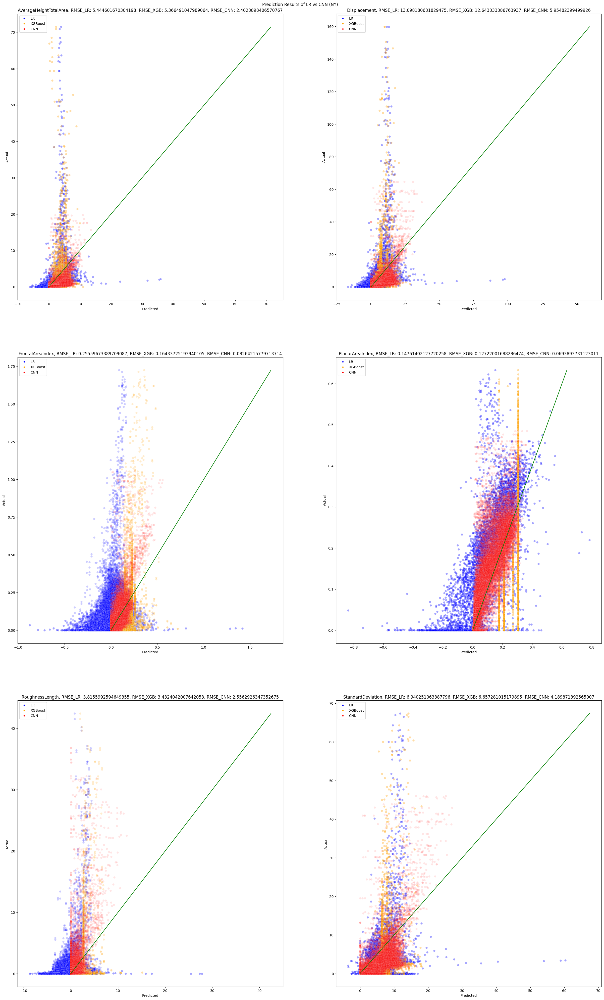

In [152]:
# ny comparison
fig, axes = plt.subplots(3, 2, figsize= (30, 45))
fig.suptitle('Prediction Results of LR vs CNN (NY)')
fig.subplots_adjust(top=0.97)
for ump in range(ny_y.shape[1]):
    # Center Line
    ax = sns.lineplot(x= y_test[:, ump]*ds_tokyo.UMP_max[ump], y = y_test[:, ump]*ds_tokyo.UMP_max[ump], ax= axes[ump//2, ump%2], color= "green")

    # LR
    sns.scatterplot(x= regs_mean[ump].predict(x_mean_test)*ds_tokyo.UMP_max[ump], y= y_test[:, ump]*ds_tokyo.UMP_max[ump], alpha= 0.1, ax= axes[ump//2, ump%2], color= "blue")

    # XGBoost
    sns.scatterplot(x= xgb_lst[ump].predict(x_mean_test)*ds_tokyo.UMP_max[ump], y= y_test[:, ump]*ds_tokyo.UMP_max[ump], alpha= 0.1, ax= axes[ump//2, ump%2], color= "orange")

    # CNN
    sns.scatterplot(y= ny_y[:, ump].cpu()* ds_tokyo.UMP_max[ump], x= ny_preds[:, ump].cpu()* ds_tokyo.UMP_max[ump], alpha= 0.1, ax= axes[ump//2, ump%2], color= "red")
    
    # Labels
    ax.set(ylabel= "Actual", xlabel= "Predicted")
    rmse_lr = math.sqrt(sklearn.metrics.mean_squared_error(regs_mean[ump].predict(x_mean_test), y_test[:, ump]))* ds_tokyo.UMP_max[ump]
    rmse_xgb = math.sqrt(sklearn.metrics.mean_squared_error(xgb_lst[ump].predict(x_mean_test), y_test[:, ump]))* ds_tokyo.UMP_max[ump]
    rmse_cnn = math.sqrt(sklearn.metrics.mean_squared_error(ny_preds[:, ump].cpu(), ny_y[:, ump].cpu()))* ds_tokyo.UMP_max[ump]

    axes[ump//2, ump%2].set_title(f"{UMP[ump]}, RMSE_LR: {rmse_lr}, RMSE_XGB: {rmse_xgb}, RMSE_CNN: {rmse_cnn}")

    # Legend
    custom = [Line2D([], [], marker='.', color='blue', linestyle='None'), 
              Line2D([], [], marker='.', color='orange', linestyle='None'),
              Line2D([], [], marker='.', color='red', linestyle='None')]
    ax.legend(custom, ['LR', 'XGBoost', 'CNN'], loc='upper left')

# Mapping Predictions

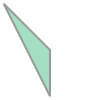

In [119]:
shapely.Polygon([(0, 2), (0, 2), (1, 1), (1, 0)])

In [120]:
x_min, y_min, x_max, y_max = tokyo_bounds[0]

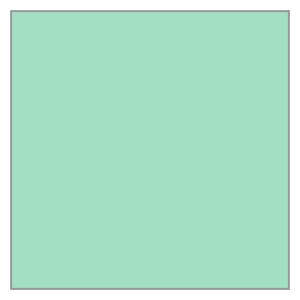

In [121]:
shapely.Polygon([(x_min, y_min), (x_min, y_max), (x_max, y_max), (x_max, y_min)])

In [123]:
tokyo_preds_df = pd.DataFrame(tokyo_preds, columns= UMP)
tokyo_preds_df.shape

(13120, 6)

In [124]:
tokyo_bounds
tokyo_polys = []
for poly in tokyo_bounds:
    x_min, y_min, x_max, y_max = poly
    tokyo_polys.append(shapely.Polygon([(x_min, y_min), (x_min, y_max), (x_max, y_max), (x_max, y_min)]))
tokyo_preds_gdf = gpd.GeoDataFrame(geometry= pd.Series(tokyo_polys), data= tokyo_preds_df)

<Axes: >

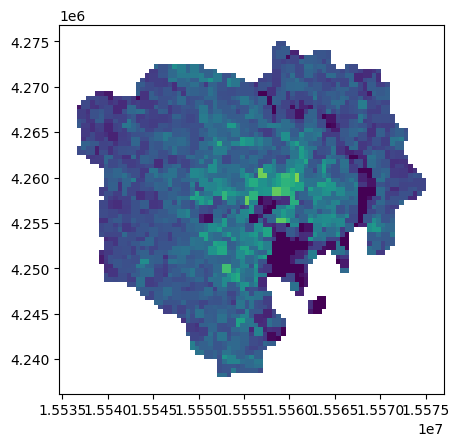

In [126]:
tokyo_preds_gdf.plot(column= UMP[0])

In [76]:
# Make the predictions and actual a gdf, then from there match the geom from the original gdf

# Create the dfs
tokyo_pred_df = pd.DataFrame(torch.cat([tokyo_preds, tokyo_y], dim= 1).numpy(), columns= [ump+"_pred" for ump in UMP] + UMP)
tokyo_ump_df = ds_tokyo.ump_df

In [77]:
tokyo_ump_df.columns, tokyo_pred_df.columns

(Index(['geometry', 'AverageHeightArea', 'AverageHeightBuilding',
        'AverageHeightTotalArea', 'Displacement', 'FrontalAreaIndex',
        'MaximumHeight', 'Percentile', 'PercentileHeight', 'PlanarAreaIndex',
        'Rotation', 'RoughnessLength', 'StandardDeviation', 'key'],
       dtype='object'),
 Index(['AverageHeightTotalArea_pred', 'Displacement_pred',
        'FrontalAreaIndex_pred', 'PlanarAreaIndex_pred', 'RoughnessLength_pred',
        'StandardDeviation_pred', 'AverageHeightTotalArea', 'Displacement',
        'FrontalAreaIndex', 'PlanarAreaIndex', 'RoughnessLength',
        'StandardDeviation'],
       dtype='object'))

In [78]:
tokyo_pred_df = tokyo_pred_df.sort_values(by= UMP)
tokyo_ump_df = tokyo_ump_df.sort_values(by= UMP)

In [79]:
tokyo_pred_df.shape, tokyo_ump_df.shape

((13120, 12), (13144, 14))

In [107]:
gpd.GeoDataFrame(tokyo_pred_df, geometry= "geometry").plot()

ValueError: Unknown column geometry

In [105]:
tokyo_merged_df = tokyo_pred_df.merge(tokyo_ump_df)
tokyo_merged_df.shape

(8464, 20)

<Axes: >

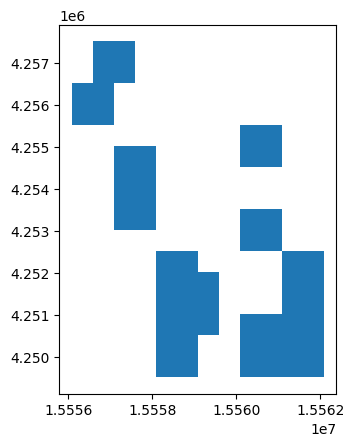

In [108]:
gpd.GeoDataFrame(data= tokyo_merged_df, geometry= "geometry").plot()

In [93]:
tokyo_pred_df.columns, tokyo_ump_df.columns

(Index(['AverageHeightTotalArea_pred', 'Displacement_pred',
        'FrontalAreaIndex_pred', 'PlanarAreaIndex_pred', 'RoughnessLength_pred',
        'StandardDeviation_pred', 'AverageHeightTotalArea', 'Displacement',
        'FrontalAreaIndex', 'PlanarAreaIndex', 'RoughnessLength',
        'StandardDeviation'],
       dtype='object'),
 Index(['geometry', 'AverageHeightArea', 'AverageHeightBuilding',
        'AverageHeightTotalArea', 'Displacement', 'FrontalAreaIndex',
        'MaximumHeight', 'Percentile', 'PercentileHeight', 'PlanarAreaIndex',
        'Rotation', 'RoughnessLength', 'StandardDeviation', 'key'],
       dtype='object'))

In [94]:
tokyo_merged_df = pd.concat([tokyo_pred_df, tokyo_ump_df["geometry"]], axis= 1)
tokyo_merged_df = tokyo_merged_df.dropna()
tokyo_merged_df.shape

(13120, 13)

In [95]:
tokyo_merged_gdf = gpd.GeoDataFrame(data= tokyo_merged_df, geometry= "geometry")
# tokyo_merged_gdf.plot(column= UMP[0])

In [96]:
tokyo_merged_df.dtypes

AverageHeightTotalArea_pred     float64
Displacement_pred               float64
FrontalAreaIndex_pred           float64
PlanarAreaIndex_pred            float64
RoughnessLength_pred            float64
StandardDeviation_pred          float64
AverageHeightTotalArea          float64
Displacement                    float64
FrontalAreaIndex                float64
PlanarAreaIndex                 float64
RoughnessLength                 float64
StandardDeviation               float64
geometry                       geometry
dtype: object

In [97]:
tokyo_merged_gdf.dtypes

AverageHeightTotalArea_pred     float64
Displacement_pred               float64
FrontalAreaIndex_pred           float64
PlanarAreaIndex_pred            float64
RoughnessLength_pred            float64
StandardDeviation_pred          float64
AverageHeightTotalArea          float64
Displacement                    float64
FrontalAreaIndex                float64
PlanarAreaIndex                 float64
RoughnessLength                 float64
StandardDeviation               float64
geometry                       geometry
dtype: object

<Axes: >

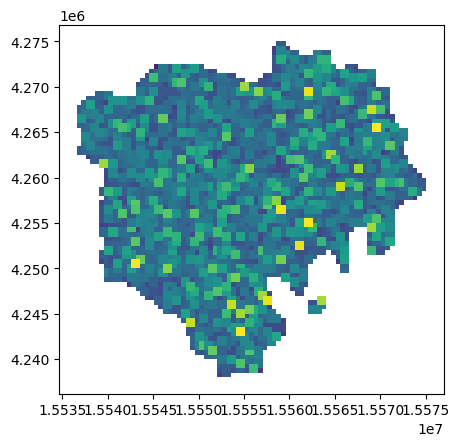

In [99]:
tokyo_merged_gdf.plot(column= UMP[1])

<Axes: >

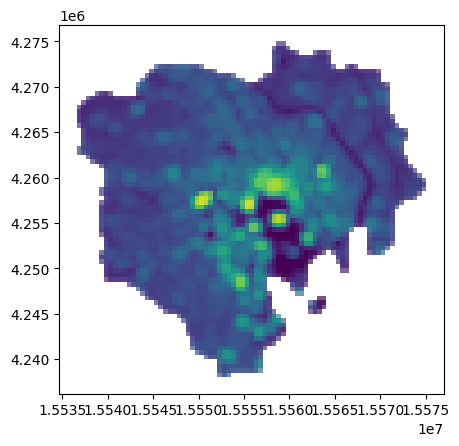

In [103]:
gpd.GeoDataFrame(data= tokyo_ump_df, geometry= "geometry").plot(column= UMP[0], alpha= 0.25)